In [24]:
import h5py
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, find_peaks
import numpy as np
import datetime
import pandas as pd
import obspy
from obspy import UTCDateTime
from obspy.clients.fdsn import Client
import time
import glob
import os
import pytz
from tqdm import tqdm
import csv
import matplotlib.dates as mdates
import csv
import re
import os
from TMfunctions import *




In [2]:
#time .h5 for the swarm
import datetime


# Load the timestamps from the HDF5 file
file_path = '/data/data4/veronica-scratch-rainier/test_corr/timestamps.h5'


with h5py.File(file_path, 'r') as f:
    timestamps_pt = np.array(f['timestamps'])

# Define the Pacific Timezone
pt_timezone = pytz.timezone('America/Los_Angeles')

# Convert timestamps from microseconds to seconds
timestamps_seconds = timestamps_pt / 1e6

# Convert timestamps to datetime objects in Pacific Time
datetime_objects_pt = [datetime.datetime.fromtimestamp(ts, pt_timezone) for ts in timestamps_seconds]

# Define the UTC Timezone
utc_timezone = pytz.timezone('UTC')

# Convert datetime objects to UTC
datetime_objects_utc = [dt_pt.astimezone(utc_timezone) for dt_pt in datetime_objects_pt]




   


# Buiding outputfiles and correlations for each template on the list

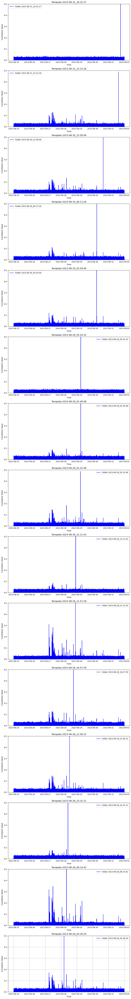

In [22]:
#test to build the CC normalized to 1, 



## Directorio base donde se encuentran las carpetas
#base_directory = '/data/data4/veronica-scratch-rainier/test_corr'

# Obtener una lista de todas las carpetas en el directorio base
#folders = [folder for folder in os.listdir(base_directory) if os.path.isdir(os.path.join(base_directory, folder))]

# Inicializar una lista para almacenar los datos concatenados por cada carpeta
#concatenated_data_per_folder = []

# Iterar sobre las carpetas y cargar los archivos .npy
#for folder in folders:
#    folder_path = os.path.join(base_directory, folder)
#    npy_files = [np.load(os.path.join(folder_path, file)) for file in os.listdir(folder_path) if file.endswith('.npy')]
#    concatenated_data_per_folder.append(np.concatenate(npy_files, axis=0))

## Crear el rango de fechas o tiempo con exactamente 20 objetos datetime por segundo
## Asumiendo que ya tienes definido time_range adecuadamente

# Graficar los datos para cada carpeta
#fig, axs = plt.subplots(len(folders), 1, figsize=(10, 5*len(folders)))

#for i, folder_data in enumerate(concatenated_data_per_folder):
#    axs[i].plot(time_range[0:len(folder_data)], folder_data, label=f'Folder {folders[i]}', color='blue', linestyle='-')
#    axs[i].set_title(f'Template {folders[i]}')
#    axs[i].set_xlabel('Time')
#    axs[i].set_ylabel('Correlation Value')
#    axs[i].legend()  # Add legend to each subplot
#    axs[i].set_ylim([0,0.5])  # Set y-axis limits from 0 to 0.5
    
#    # Guardar la figura como PNG
#    output_folder = '/data/data4/veronica-scratch-rainier/plot-TM-results/CC_plots'  # Directorio de salida
#    if not os.path.exists(output_folder):
#        os.makedirs(output_folder)
#    output_file_path = os.path.join(output_folder, f'corr_values_{folders[i]}.png')  # Ruta de salida
#    plt.savefig(output_file_path, dpi=300)  # Guardar la figura como PNG

#plt.tight_layout()
#plt.grid()
#plt.show()


# add thresold and detections stuff

In [14]:
time_range = datetime_objects_utc
# Define los umbrales
thresholds = [0.5, 0.05, 0.04, 0.045]

# Directorio donde se guardarán los archivos de texto
output_directory = "textfiles_results_thresholds"

# Itera sobre cada carpeta
for folder, folder_data in zip(folders, concatenated_data_per_folder):
    # Crear directorio si no existe
    folder_output_directory = os.path.join(output_directory, folder)
    if not os.path.exists(folder_output_directory):
        os.makedirs(folder_output_directory)
    
    # Ruta del archivo de salida
    output_file_path = os.path.join(folder_output_directory, f"detections_results_{folder}.txt")
    
    # Abre el archivo de salida en modo escritura
    with open(output_file_path, 'w') as file:
        # Escribe los encabezados
        file.write("Threshold\tNumber of Detections\tDetection Times (UTC)\n")

        # Itera sobre cada umbral
        for threshold in thresholds:
            # Encuentra los índices donde los valores superan el umbral
            indices_above_threshold = np.where(np.abs(folder_data) > threshold)[0]
            diff_indices = np.diff(indices_above_threshold)
            group_changes = np.where(diff_indices > 10)[0]
            detection_groups = np.split(indices_above_threshold, group_changes + 1)

            # Itera sobre cada grupo de detección
            for group in detection_groups:
                # Verifica si el grupo no está vacío
                if len(group) > 0:
                    # Toma solo la primera fecha en cada grupo
                    first_detection_time_utc = time_range[group[0]].strftime('%Y-%m-%d_%H.%M.%S')
                    #first_detection_time_utc = datetime.datetime.utcfromtimestamp(time_range[group[0]].timestamp()).strftime('%Y-%m-%d_%H.%M.%S')
                    
                    # Escribe los datos en una fila separados por tabulaciones
                    file.write(f"{threshold}\t{len(detection_groups)}\t{first_detection_time_utc}\n")
                else:
                    print("Grupo vacío encontrado para el umbral:", threshold)

# Mensaje de confirmación
print(f"Los resultados se han guardado en {output_directory}")


Grupo vacío encontrado para el umbral: 0.5
Grupo vacío encontrado para el umbral: 0.5
Grupo vacío encontrado para el umbral: 0.5
Los resultados se han guardado en textfiles_results_thresholds


In [16]:
#making a draft catalog for 0.04 thresold value

from datetime import datetime

# Directorio donde se guardarán los archivos de texto
output_directory = "textfiles_results_thresholds"

# Umbral para el cual se buscarán valores repetidos en la tercera columna
target_threshold = 0.045

# Diccionario para almacenar los valores de tiempo por umbral
detection_times_per_threshold = {}

# Itera sobre cada carpeta
for folder in folders:
    # Ruta del archivo de salida
    output_file_path = os.path.join(output_directory, folder, f"detections_results_{folder}.txt")

    # Abre el archivo de salida en modo lectura
    with open(output_file_path, 'r') as file:
        # Lee todas las líneas del archivo
        lines = file.readlines()

        # Busca el valor repetido para el umbral especificado
        for line in lines:
            if line.startswith('Threshold'):  # Verifica si la línea es el encabezado
                continue  # Si es el encabezado, pasa al siguiente
            threshold, _, detection_time_utc = line.strip().split('\t')
            if float(threshold) == target_threshold:
                if target_threshold not in detection_times_per_threshold:
                    detection_times_per_threshold[target_threshold] = set()
                detection_times_per_threshold[target_threshold].add(detection_time_utc)

# Diccionario para almacenar los valores únicos por umbral y tolerancia de tiempo
unique_detection_times_per_threshold = {}

# Itera sobre cada umbral y sus valores de tiempo
for threshold, detection_times in detection_times_per_threshold.items():
    unique_detection_times = set()
    for detection_time in detection_times:
        detection_time_obj = datetime.strptime(detection_time, '%Y-%m-%d_%H.%M.%S')
        # Verifica si hay valores dentro de una tolerancia de 3 segundos
        is_unique = True
        for unique_time in unique_detection_times:
            time_difference = abs((detection_time_obj - unique_time).total_seconds())
            if time_difference <= 4:
                is_unique = False
                break
        if is_unique:
            unique_detection_times.add(detection_time_obj)
    unique_detection_times_per_threshold[threshold] = unique_detection_times

# Guarda los valores únicos en un nuevo archivo llamado "draftcatalog.txt"
draftcatalog_file_path = "draftcatalog.txt"
with open(draftcatalog_file_path, 'w') as file:
    for threshold, unique_detection_times in unique_detection_times_per_threshold.items():
        for detection_time in unique_detection_times:
            file.write(f"{threshold}\t{detection_time.strftime('%Y-%m-%d_%H.%M.%S')}\n")

print("Valores únicos guardados en 'draftcatalog.txt'.")


Valores únicos guardados en 'draftcatalog.txt'.


In [17]:
from datetime import datetime, timedelta

# Define the function to parse a date string into a datetime object
def parse_date(date_str):
    try:
        return datetime.strptime(date_str, '%Y-%m-%d_%H.%M.%S')
    except ValueError:
        return None

# Define the time difference allowed (5 seconds)
time_difference = timedelta(seconds=6)

# Function to read dates and values from a file and return a list of tuples containing both
def read_dates_and_values_from_file(file_path):
    dates_and_values = []
    with open(file_path, 'r') as f:
        next(f)  # Skip header line
        for line in f:
            elements = line.strip().split('\t')
            if len(elements) >= 2:  # Ensure there are at least two elements
                value = elements[0]  # Extract the value from the first column
                date_str = elements[-1]  # Extract the date from the last column
                date = parse_date(date_str)
                if date is not None:
                    dates_and_values.append((value, date))
    return dates_and_values

# Read dates and values from the converted_dates_and_values_rainier_5days.txt file
converted_dates_and_values = read_dates_and_values_from_file('converted_dates_and_values_rainier_5days.txt')

# Initialize lists to store common dates and unmatched dates
common_dates = []
unmatched_dates = []

# Read dates from the draftcatalog.txt file and compare with converted dates
with open('draftcatalog.txt', 'r') as f:
    next(f)  # Skip header line
    for line in f:
        threshold_value, result_date_str = line.strip().split('\t')[:2]
        result_date = parse_date(result_date_str)  # Convert result date to a datetime object
        if result_date is not None:  # Check if result_date is not None
            # Check if the result_date has a match in converted_dates_and_values
            matched = False
            for value, converted_date in converted_dates_and_values:
                if abs(result_date - converted_date) <= time_difference:
                    common_dates.append((threshold_value, result_date, value))
                    matched = True
                    break
            if not matched:
                unmatched_dates.append((threshold_value, result_date))

# Write common and unmatched dates to the new output file
with open('matched_results.txt', 'w') as f:
    f.write("Threshold\tResult Date\tID Value\tMatch Status\n")
    for threshold_value, result_date, id_value in common_dates:
        f.write(f"{threshold_value}\t{result_date.strftime('%Y-%m-%d_%H.%M.%S')}\t{id_value}\tMatched\n")
    for threshold_value, result_date in unmatched_dates:
        f.write(f"{threshold_value}\t{result_date.strftime('%Y-%m-%d_%H.%M.%S')}\tX\tUnmatched\n")

print("Output file 'matched_results.txt' has been generated.")


Output file 'matched_results.txt' has been generated.


In [20]:
#let's save the plots and cataloging matches or not
# Define paths and folders
import os
import re
import matplotlib.dates as mdates
from scipy.signal import filtfilt, butter

# Define paths and folders
txt_file_path = '/home/velgueta/notebooks/RainierDas/txtfiles/matched_results.txt'
files_folder_path = '/data/fast1/veronica-scratch-rainier-downsampling/drive1_ds'
plots_folder = '/data/data4/veronica-scratch-rainier/plot-TM-results/plots-newcatalog'

# Regular expression pattern to search for dates in the correct format
date_pattern = re.compile(r'(\d{4}-\d{2}-\d{2})_(\d{2})\.(\d{2})')

# Extract information from output.txt
result_dates = []
thresholds = []
id_values = []
match_statuses = []

with open(txt_file_path, 'r') as txt_file:
    for line in txt_file:
        columns = line.strip().split('\t')
        threshold = columns[0]
        result_date = columns[1]
        id_value = columns[2]
        match_status = columns[3]
        result_dates.append(result_date)
        thresholds.append(threshold)
        id_values.append(id_value)
        match_statuses.append(match_status)

# Define the threshold to search
threshold_to_search = '0.045'

# Create the folder for plots if it doesn't exist
if not os.path.exists(plots_folder):
    os.makedirs(plots_folder)

# Create a folder to hold all the plots
all_plots_folder = os.path.join(plots_folder, f'{threshold_to_search}_plots')
if not os.path.exists(all_plots_folder):
    os.makedirs(all_plots_folder)

# Iterate over the result dates and search for corresponding files with the specific threshold
for i, result_date in enumerate(result_dates):
    threshold = thresholds[i]
    id_value = id_values[i]
    match_status = match_statuses[i]
    match = date_pattern.match(result_date)
    if match:
        date_part = match.group(1)
        hour_part = match.group(2)
        minute_part = match.group(3)
        date_to_search = f"{date_part}_{hour_part}.{minute_part}"
        if threshold == threshold_to_search:
            found = False
            for file_name in os.listdir(files_folder_path):
                if date_to_search in file_name:
                    print(f"Found a file with the searched date: {file_name}")
                    found = True

                    # Process the found file
                    chan_min = 0
                    chan_max = -1
                    data_file_path = os.path.join(files_folder_path, file_name)
                    data_file = h5py.File(data_file_path, 'r')
                    this_data = np.array(data_file['Acquisition/Raw[0]/RawData'][:, chan_min:chan_max])
                    this_time = np.array(data_file['Acquisition/Raw[0]/RawDataTime'])
                    attrs = dict(data_file['Acquisition'].attrs)
                    data_file.close()

                    low_cut1 = 2
                    hi_cut1 = 9
                    fs = 20
                    b, a = butter(2, (low_cut1, hi_cut1), 'bp', fs=fs)
                    data_filt = filtfilt(b, a, this_data, axis=0)

                    date_format = mdates.DateFormatter('%H:%M:%S')
                    x_lims = mdates.date2num(this_time)
                    x_max = data_filt.shape[1] * attrs['SpatialSamplingInterval'] / 1000
                    dx = x_max / data_filt.shape[1]

                    fig, ax = plt.subplots(figsize=(20, 10))
                    plt.imshow(data_filt.T, cmap='seismic', aspect='auto', vmin=-0.05, vmax=0.05,
                               extent=[x_lims[0], x_lims[-1], x_max, 0])
                    plt.xlabel("Time UTC", fontsize=25)
                    plt.ylabel("Optical distance (km)", fontsize=25)
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
                    ax.xaxis_date()

                    # Set font size for time and channel axis labels
                    plt.xticks(fontsize=20)
                    plt.yticks(fontsize=20)

                    # Set title including threshold, ID value, and match status
                    plt.title(f'Threshold: {threshold}, ID: {id_value}, Match Status: {match_status}', fontsize=20)

                    # Save the plot in the all_plots_folder
                    full_path = os.path.join(all_plots_folder, f'{file_name}.png')
                    plt.savefig(full_path, dpi=300, bbox_inches='tight')
                    plt.close(fig)
                    break

            if not found:
                print(f"No matching file found for the searched date: {date_to_search}")


Found a file with the searched date: new_decimator_2023-08-28_21.52.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-27_11.16.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-30_15.58.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-30_05.59.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-28_04.28.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-27_10.10.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-28_12.58.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-30_00.51.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-27_06.54.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-28_08.14.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-27_05.36.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-30_06.13.00_UTC.h5
Found a file with the searched date: new_decimator_2023-08-27_10

# plots of the catalog

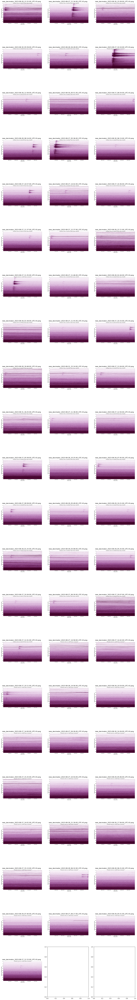

In [21]:
import os
import matplotlib.pyplot as plt

# Ruta de la carpeta que contiene las imágenes PNG
folder_path = '/data/data4/veronica-scratch-rainier/plot-TM-results/plots-newcatalog/0.045_plots'

# Obtener la lista de archivos en la carpeta
image_files = os.listdir(folder_path)

# Configurar el tamaño de la figura y el número de columnas para mostrar las imágenes
fig, axs = plt.subplots(nrows=len(image_files) // 3 + 1, ncols=3, figsize=(15, 5 * (len(image_files) // 3 + 1)))

# Iterar sobre los archivos de imagen y mostrar cada una en su respectivo subplot
for i, image_file in enumerate(image_files):
    # Calcular las coordenadas del subplot
    row = i // 3
    col = i % 3
    
    # Ruta completa de la imagen
    image_path = os.path.join(folder_path, image_file)
    
    # Mostrar la imagen en el subplot correspondiente
    if os.path.isfile(image_path):
        image = plt.imread(image_path)
        axs[row, col].imshow(image)
        axs[row, col].axis('off')
        axs[row, col].set_title(image_file)

# Ajustar el espaciado entre los subplots y mostrar la figura
plt.tight_layout()
plt.show()


# MAD and detections

In [38]:
#parker fuctions/slack fuctions


# Parker functions
def mad_func_li(arr):
    """ Median Absolute Deviation: Using the formulation in Li and Zhan 2018
    Pushing the limit of earthquake detection with DAS and template matching
    """
    mean = np.mean(arr)
    med = np.median(arr)
    return np.median(np.abs(mean - med))

def mad_func_shelly(arr):
    """ Median Absolute Deviation: Using the formulation in Shelly 2007
    Pushing the limit of earthquake detection with DAS and template matching
    """
    med = np.median(arr)
    return np.median(np.abs(arr - med))

def detections(cc_arr, mode='shelly'):
    """ using detection significance from Li and Zhan 2018
    det = (peak - med) / mad
    """
    med = np.median(cc_arr)
    if mode == 'shelly':
        mad = mad_func_shelly(cc_arr)
    elif mode == 'li':
        mad = mad_func_li(cc_arr)

    det = (cc_arr - med) / mad
    return det, mad

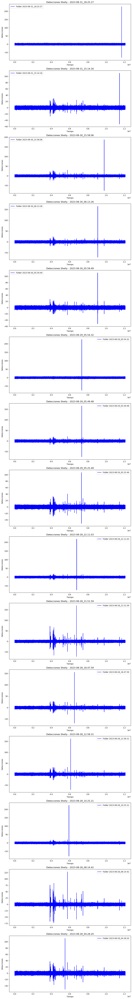

In [39]:


# Obtener una lista de todas las carpetas en el directorio base
folders = [folder for folder in os.listdir(base_directory) if os.path.isdir(os.path.join(base_directory, folder))]

# Inicializar una lista para almacenar los datos concatenados por cada carpeta
concatenated_data_per_folder = []

# Iterar sobre las carpetas y cargar los archivos .npy
for folder in folders:
    folder_path = os.path.join(base_directory, folder)
    npy_files = [np.load(os.path.join(folder_path, file)) for file in os.listdir(folder_path) if file.endswith('.npy')]
    concatenated_data_per_folder.append(np.concatenate(npy_files, axis=0))

# Calcular detecciones y trazar los resultados
fig, axs = plt.subplots(len(folders), 1, figsize=(10, 5*len(folders)))

for i, (folder, folder_data) in enumerate(zip(folders, concatenated_data_per_folder)):
    det_shelly, mad = detections(folder_data, mode='shelly')
    axs[i].plot(det_shelly, label=f'Folder {folder}', color='blue')
    axs[i].set_title(f'Detecciones Shelly - {folder}')
    axs[i].set_xlabel('Time')
    axs[i].set_ylabel('Detecciones')
    axs[i].legend()  # Agregar leyenda a cada subplot

plt.tight_layout()
plt.show()


In [ ]:
#queremos clcular el thresold based on MAD, it seems acceptable try between 3 times MAD to 6 times


# getting the histograms for each folder

In [ ]:
# Calcular detecciones y graficar los resultados
fig, axs = plt.subplots(len(folders), 2, figsize=(15, 5*len(folders)))  # 2 subplots per folder: one for detections, one for MAD histogram

for i, (folder, folder_data) in enumerate(zip(folders, concatenated_data_per_folder)):
    det_shelly, mad = detections(folder_data, mode='shelly')

    # Plot detections
    axs[i, 0].plot(det_shelly, label=f'Folder {folder}', color='blue')
    axs[i, 0].set_title(f'Detecciones Shelly - {folder}')
    axs[i, 0].set_xlabel('Tiempo')
    axs[i, 0].set_ylabel('Detecciones')
    axs[i, 0].legend()

    # Plot MAD histogram
    axs[i, 1].hist(mad, bins=30, color='green', alpha=0.7)
    axs[i, 1].set_title(f'Histogram of MAD - {folder}')
    axs[i, 1].set_xlabel('MAD')
    axs[i, 1].set_ylabel('Frecuency')

plt.tight_layout()
plt.show()


In [ ]:
# Calculate MAD for each folder
mads_per_folder = {}
for folder, folder_data in zip(folders, concatenated_data_per_folder):
    mad = np.median(np.abs(folder_data - np.median(folder_data)))
    mads_per_folder[folder] = mad
    print(f"MAD for folder {folder}: {mad}") 

# Define multiples of MAD as thresholds
multipliers = [20, 50, 100]  # 2 times MAD up to 6 times MAD
thresholds_per_folder = {}
for folder, mad in mads_per_folder.items():
    thresholds = [multiplier * mad for multiplier in multipliers]
    thresholds_per_folder[folder] = thresholds

# Directory to save text files
output_directory = "textfiles_results_thresholds"

# Iterate over each folder
for folder, folder_data in zip(folders, concatenated_data_per_folder):
    # Create directory if it doesn't exist
    folder_output_directory = os.path.join(output_directory, folder)
    if not os.path.exists(folder_output_directory):
        os.makedirs(folder_output_directory)
    
    # Output file path
    output_file_path = os.path.join(folder_output_directory, f"detections_results_MAD_{folder}.txt")
    
    # Open output file in write mode
    with open(output_file_path, 'w') as file:
        # Write headers
        file.write("Threshold\tNumber of Detections\tDetection Times (UTC)\n")

        # Get thresholds corresponding to this folder
        thresholds = thresholds_per_folder[folder]

        # Iterate over each threshold
        for threshold in thresholds:
            # Find indices where values exceed the threshold
            indices_above_threshold = np.where(np.abs(folder_data) > threshold)[0]
            diff_indices = np.diff(indices_above_threshold)
            group_changes = np.where(diff_indices > 10)[0]
            detection_groups = np.split(indices_above_threshold, group_changes + 1)

            # Iterate over each detection group
            for group in detection_groups:
                # Check if the group is not empty
                if len(group) > 0:
                    # Take only the first timestamp in each group
                    first_detection_time_utc = time_range[group[0]].strftime('%Y-%m-%d_%H.%M.%S')
                    
                    # Write data in a tab-separated row
                    file.write(f"{threshold}\t{len(detection_groups)}\t{first_detection_time_utc}\n")
                else:
                    print("Empty group found for threshold:", threshold)

# Confirmation message
print(f"The results have been saved in {output_directory}")


In [ ]:
#debugging

import os
import numpy as np

# Define multiples of MAD as thresholds
multipliers = [2, 3, 4, 5, 6]  # 2 times MAD up to 6 times MAD
thresholds_per_folder = {}

# Iterate over each folder to calculate MAD and thresholds
for folder, folder_data in zip(folders, concatenated_data_per_folder):
    mad = np.median(np.abs(folder_data - np.median(folder_data)))
    mads_per_folder[folder] = mad
    print(f"MAD for folder {folder}: {mad}")

    # Calculate thresholds for this folder
    thresholds = [multiplier * mad for multiplier in multipliers]
    thresholds_per_folder[folder] = thresholds
    print(f"Thresholds for folder {folder}: {thresholds}")

# Directory to save text files
output_directory = "textfiles_results_thresholds"

# Iterate over each folder
for folder, folder_data in zip(folders, concatenated_data_per_folder):
    # Create directory if it doesn't exist
    folder_output_directory = os.path.join(output_directory, folder)
    if not os.path.exists(folder_output_directory):
        os.makedirs(folder_output_directory)

    # Output file path
    output_file_path = os.path.join(folder_output_directory, f"detections_results_MAD_{folder}.txt")

    # Open output file in write mode
    with open(output_file_path, 'w') as file:
        # Write headers
        file.write("Threshold\tNumber of Detections\tDetection Times (UTC)\n")

        # Get thresholds corresponding to this folder
        thresholds = thresholds_per_folder[folder]

        # Iterate over each threshold
        for threshold in thresholds:
            # Encuentra los índices donde los valores superan el umbral
            indices_above_threshold = np.where(np.abs(folder_data) > threshold)[0]
            diff_indices = np.diff(indices_above_threshold)
            group_changes = np.where(diff_indices > 10)[0]
            detection_groups = np.split(indices_above_threshold, group_changes + 1)

            # Debug: Print threshold and number of detections
            print(f"Threshold: {threshold}, Number of Detections: {len(detection_groups)}")

            # Iterate over each detection group
            for group in detection_groups:
                # Check if the group is not empty
                if len(group) > 0:
                    # Take only the first timestamp in each group
                    first_detection_time_utc = time_range[group[0]].strftime('%Y-%m-%d_%H.%M.%S')

                    # Debug: Print first detection time
                    #print(f"First Detection Time UTC: {first_detection_time_utc}")

                    # Write data in a tab-separated row
                    file.write(f"{threshold}\t{len(detection_groups)}\t{first_detection_time_utc}\n")
                else:
                    print("Empty group found for threshold:", threshold)

# Confirmation message
print(f"The results have been saved in {output_directory}")
